**<p style='text-align: right;'>Ver. 1.0.3</p>**

#### IMPORTS
Execute the cell below to import all packages needed.  If you are not using Noteable, make sure the python and package version numbers reported match the python and package numbers, which can be checked by running the following cell. The Python version does not need to be the same, but it should be $3.9.p$, where $p \ge 12$.

In [1]:
import pandas as pd
import numpy as np
import scipy
import math
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import seaborn as sns

from sklearn.model_selection import train_test_split, cross_val_score, KFold
from sklearn.linear_model import LogisticRegression, LinearRegression
from sklearn.preprocessing import PolynomialFeatures
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.decomposition import PCA
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, mean_squared_error, r2_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.cluster import KMeans

from iaml23cw_helpers import *
print_versions();

# You may add other libraries here or in your other cells as needed.



Python	3.9.12 : Ok
Scipy	1.7.3 : Ok
Numpy	1.21.6 : Ok
Sklearn	1.1.1 : Ok
Pandas	1.4.2 : Ok
Matplotlib	3.5.2 : Ok
Seaborn	0.11.2 : Ok


\pagebreak

# Experiments with a stock price  data set

The stock price data set we use is a stock market index (composite stock price index of common stocks) in a country for the period between 2000 and 2022, consisting of four historical prices ('Open', 'High', 'Low', 'Close', which denote the opening, highest, lowest, and closing prices on the trading day, respectively) and trading volume. For the convenience, we have added some features to the data set. They are four [technical indicators](https://www.fidelity.com/bin-public/060_www_fidelity_com/documents/learning-center/Understanding-Indicators-TA.pdf) (RSI, SMA, BBP, ADX), 'Tomorrow', and 'Target'. 'Tomorrow' holds the closing price of next trading day, which we will use for price prediction, and 'Target' is a binary indicator (label), which takes 1 if 'Tomorrow' is higher than 'Close', 0 otherwise, which we will use for the prediction of movement direction.

*** Loading data ***
Make sure that you have the data set files "dset_q1a.csv" and "dset_q1b.csv" in your environment. We will use the first file in the following sub questions except the last subquestion 1.8. Run the following cell to load the first file.

In [2]:
# Load the data set "dset_q1a.csv"
df = pd.read_csv("dset_q1a.csv", index_col="Date", parse_dates=True)

# ========== 1.1 ==========
###  Describe the main properties of the data:
1. [Code] Display the shape of the data
2. [Code] Display the range of the dataframe index
3. [Code] What data are present and what types of data are they? Display the information using **pandas.DataFrame.info**.
4. [Code] Display the highest price, the lowest price, and the mean of the closing price ('Close') for each year in the data. (Hint: the highest price for each year is sought from the price 'High'.)

\pagebreak
## Codes for 1.1

In [3]:
#(1) Your code goes here
df.shape

(5642, 11)

In [4]:
#(2) Your code goes here
df.index

DatetimeIndex(['2000-02-15', '2000-02-16', '2000-02-17', '2000-02-18',
               '2000-02-21', '2000-02-22', '2000-02-23', '2000-02-24',
               '2000-02-25', '2000-02-28',
               ...
               '2022-12-15', '2022-12-16', '2022-12-19', '2022-12-20',
               '2022-12-21', '2022-12-22', '2022-12-23', '2022-12-26',
               '2022-12-27', '2022-12-28'],
              dtype='datetime64[ns]', name='Date', length=5642, freq=None)

In [5]:
#(3) Your code goes here
df.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 5642 entries, 2000-02-15 to 2022-12-28
Data columns (total 11 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   Open      5642 non-null   float64
 1   High      5642 non-null   float64
 2   Low       5642 non-null   float64
 3   Close     5642 non-null   float64
 4   Volume    5642 non-null   int64  
 5   RSI       5642 non-null   float64
 6   SMA       5642 non-null   float64
 7   BBP       5642 non-null   float64
 8   ADX       5642 non-null   float64
 9   Tomorrow  5642 non-null   float64
 10  Target    5642 non-null   int64  
dtypes: float64(9), int64(2)
memory usage: 528.9 KB


In [6]:
#(4) Your code goes here
df_copy = df.copy(deep=True)
df_copy.drop(["Open", "Volume", "RSI", "SMA", "BBP", "ADX", "Tomorrow", "Target"], axis=1, inplace=True)

yearly_output = pd.DataFrame(columns=['Highest Price', 'Lowest Price', 'Mean of Close'])

for i in range(2000, 2023):
    single_year_data = df_copy['%d-01-01' % (i): '%d-01-01' % (i + 1)];
    yearly_output.loc[i] = [single_year_data['High'].max(), 
                        single_year_data['Low'].min(), 
                        single_year_data['Close'].mean()]
yearly_output

,Highest Price,Lowest Price,Mean of Close
2000,928.549988,483.579987,704.482358
2001,715.929993,463.540009,572.834472
2002,943.539978,576.489990,756.978033
2003,824.260010,512.299988,679.830001
2004,939.520020,713.989990,832.916307
2005,1383.140015,866.169983,1073.577590
2006,1464.699951,1192.089966,1352.218255
2007,2085.449951,1345.079956,1713.674165
2008,1901.130005,892.159973,1529.494194
2009,1723.170044,992.690002,1429.038258


\pagebreak

# ========== 1.2 ==========
Perform an *exploratory data analysis* on the dataset by studying the following:
1. [Code and text] Plot the stock market closing price ('Close') and comment on it.
2. [Code] For the period from the beginning of year 2007 until the end of 2008, plot the closing price ('Close') and volumes ('Volume') respectively, where you show months on the x-axis and indicate the positions of the highest and lowest values for the period.
3. [Code and text] Plot a pairplot for the dataset features using the seaborn **pairplot** and report the patterns in the given dataset.
4. [Code] Plot the correlation matrix for the dataset features.
5. [Text] Based on the results you obtained in 3 and 4 above, comment on the relationships among the features present in the dataset.

\pagebreak
## Codes for 1.2

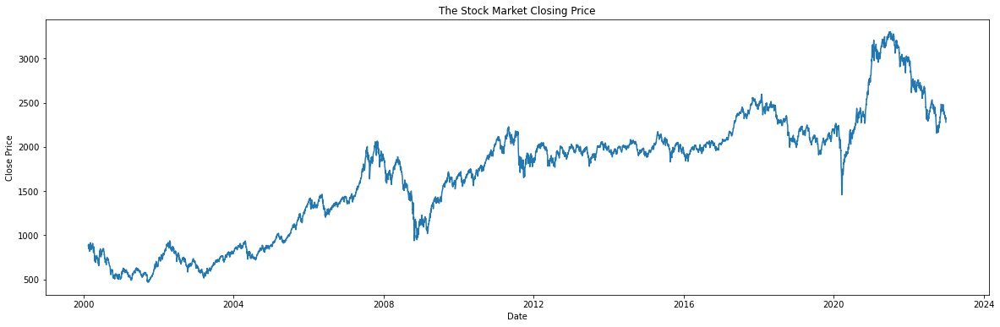

In [7]:
#(1) Your code and text goes here
plt.figure(figsize=(20,6))

plt.title('The Stock Market Closing Price')
plt.plot(df.index, df['Close'])
plt.xlabel('Date')
plt.ylabel('Close Price')

plt.show()

**Comment**: The close price fluctuates up and down frequently, but it keeps increasing in the long term.

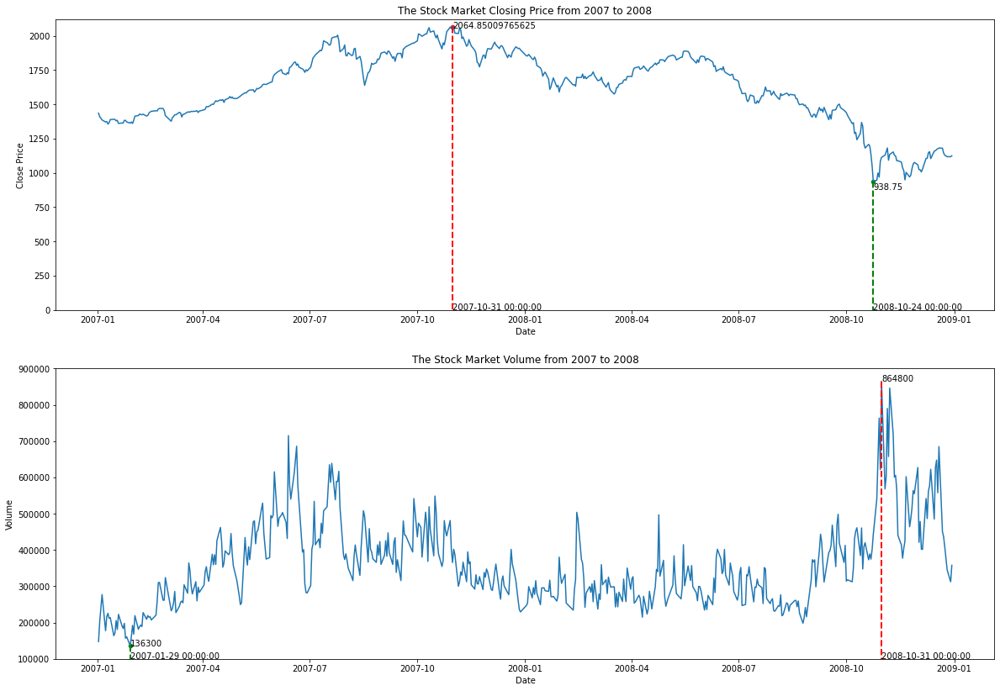

In [8]:
#(2) Your code goes here
df_copy2 = df.copy(deep=True)
df_2007_2008 = df_copy2['2007-01-01':'2009-01-01']

fig, (ax1, ax2) = plt.subplots(2,1, figsize=(20,14))

ax1.set_title('The Stock Market Closing Price from 2007 to 2008')
ax1.plot(df_2007_2008.index, df_2007_2008['Close'])
ax1.set_xlabel('Date')
ax1.set_ylabel('Close Price')
ax1.set_ylim(ymin = 0)
max_index = np.argmax(df_2007_2008['Close'])
min_index = np.argmin(df_2007_2008['Close'])
ax1.scatter(df_2007_2008.index[max_index], df_2007_2008['Close'][max_index], s=20, color='r')
ax1.plot([df_2007_2008.index[max_index],df_2007_2008.index[max_index]],[df_2007_2008['Close'][max_index],0],'r--',lw=2)
ax1.text(df_2007_2008.index[max_index], df_2007_2008['Close'][max_index] - 10, df_2007_2008['Close'][max_index])
ax1.text(df_2007_2008.index[max_index], 0, df_2007_2008.index[max_index])
ax1.scatter(df_2007_2008.index[min_index], df_2007_2008['Close'][min_index], s=20, color='g')
ax1.plot([df_2007_2008.index[min_index],df_2007_2008.index[min_index]],[df_2007_2008['Close'][min_index],0],'g--',lw=2)
ax1.text(df_2007_2008.index[min_index], df_2007_2008['Close'][min_index] - 60, df_2007_2008['Close'][min_index])
ax1.text(df_2007_2008.index[min_index], 0, df_2007_2008.index[min_index])
# todo x-axis show months
ax2.set_title('The Stock Market Volume from 2007 to 2008')
ax2.plot(df_2007_2008.index, df_2007_2008['Volume'])
ax2.set_xlabel('Date')
ax2.set_ylabel('Volume')
ax2.set_ylim(ymin = 100000)
max_index2 = np.argmax(df_2007_2008['Volume'])
min_index2 = np.argmin(df_2007_2008['Volume'])
ax2.scatter(df_2007_2008.index[max_index2], df_2007_2008['Close'][max_index2], s=20, color='r')
ax2.plot([df_2007_2008.index[max_index2],df_2007_2008.index[max_index2]],[df_2007_2008['Volume'][max_index2],100000],'r--',lw=2)
ax2.text(df_2007_2008.index[max_index2], df_2007_2008['Volume'][max_index2] - 10, df_2007_2008['Volume'][max_index2])
ax2.text(df_2007_2008.index[max_index2], 100000, df_2007_2008.index[max_index2])
ax2.scatter(df_2007_2008.index[min_index2], df_2007_2008['Volume'][min_index2], s=20, color='g')
ax2.plot([df_2007_2008.index[min_index2],df_2007_2008.index[min_index2]],[df_2007_2008['Volume'][min_index2],100000],'g--',lw=2)
ax2.text(df_2007_2008.index[min_index2], df_2007_2008['Volume'][min_index2] - 60, df_2007_2008['Volume'][min_index2])
ax2.text(df_2007_2008.index[min_index2], 100000, df_2007_2008.index[min_index2])

plt.show()

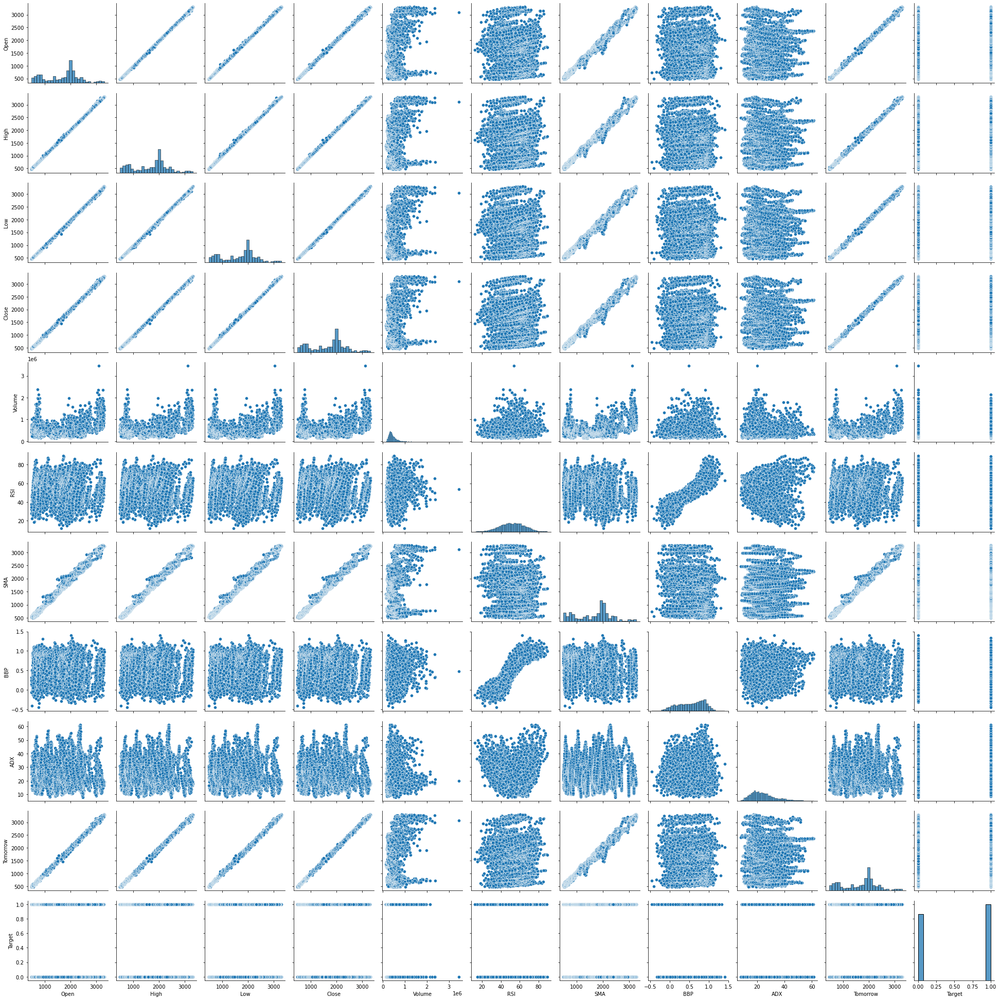

In [9]:
#(3) Your code and text goes here
sns.pairplot(data=df)
# sns.pairplot(data=df,hue='Target')

**Report patterns:**  
Viewing the pairplot above, it's obvious that there are linear relationships between some attributes:  
a) 'Open', 'High', 'Low', 'Close' and 'Tomorrow' are positively correlated in pairs.  
b) The positive correlation between any of prices (open, high, low, close, tomorrow) and SMA is not as strong as previous attributes but is also obvious.

And there exist some other patterns:  
c) Some metrices themselves follow Gaussian distribution, such as 'Volume', 'RSI' and 'ADX'.  
d) No matter how the price changes, the volume is relatively stable.  
e) RSI, BBP and ADX have nothing to do with other attributes such as opening price and closing price. But RSI is positively correlated with BBP.  
f) there seem to be an outlier in the data of 'Volume', which lies far away from other data.

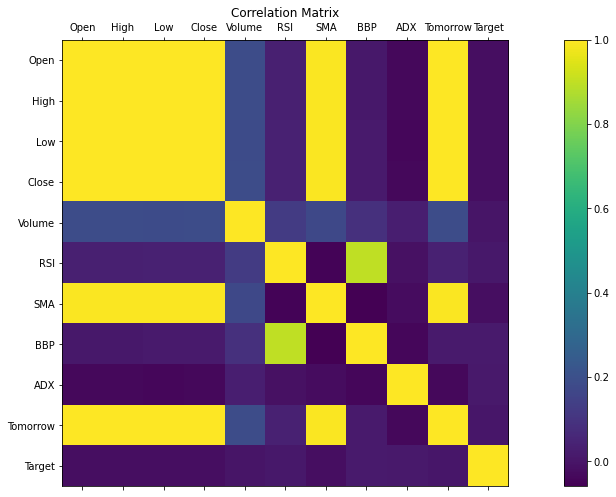

In [10]:
#(4) Your code goes here
fig = plt.figure(figsize=(20, 8))
plt.matshow(df.corr(), fignum=fig.number)
plt.xticks(range(df.select_dtypes(['number']).shape[1]), df.select_dtypes(['number']).columns)
plt.yticks(range(df.select_dtypes(['number']).shape[1]), df.select_dtypes(['number']).columns)
cb = plt.colorbar()
plt.title('Correlation Matrix');
plt.show()

#(5) Your text goes here

Observing the correlation matrix, we can find 'Open', 'High', 'Low', 'Close', 'SMA' and 'Tomorrow' are highly positively correlated in pairs because related data is very close to 1. We find the same pattern in pairplot as described in (3).  
There's also a positive correlationship between BBP and RSI, although not so strong as previous ones.  
Those blue parts describes very week positive correlation, which relationship we can find between Volume and SMA, Volume and Tomorrow.  
The purple squares tell that no linear relationship between two attributes, such as Target and SMA, Tomorrow and ADX.

Comparing these features with what we find in pairplot, most of them can be mutually verified. But it is more difficult to find weak correlation in pairplot.

\pagebreak

# ========== 1.3 ==========

We here apply linear regression to predict 'Tomorrow' from 'SMA'.
For this question, you should use the sklearn implementation of Linear Regression. Use the first 80% of the data for training and the rest 20% for testing ***without shuffling***.
1. [Code] Fit a linear regression model to the training data so that we can predict 'Tomorrow' from 'SMA'. Report the estimated model parameters w and the coefficient of determination $R^2$.
2. [Text] Describe what the parameters represent for the fitted dataset with the linear regression model.
3. [Code] Report the root mean-square error (RMSE) for the training set and test set, respectively.
4. [Code] Plot predicted values versus actual values for the test set, where the x-axis corresponds to actual values and the y-axis to predicted values. Draw a line of $y=x$ on the plot.
5. [Code] Plot 'Tomorrow' versus 'SMA' for the training set and display the regression line on the same graph. The x-axis corresponds to 'SMA' and the y-axis to 'Tomorrow'.
6. [Text] Examining the results (e.g. $R^2$ and RMSE), comment on the predictability of the model.

\pagebreak
## Codes for 1.3

In [11]:
#(1) Your code goes here
df_copy3 = df.copy(deep=True)
X = df_copy3['SMA'].values
y = df_copy3['Tomorrow'].values
X = X[:,np.newaxis]
y = y[:,np.newaxis]
# X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.8, test_size=0.2, random_state=0)
train_size = int(len(df) * 0.8)
X_train, X_test = X[:train_size], X[train_size:]
y_train, y_test = y[:train_size], y[train_size:]

lm = LinearRegression(fit_intercept=True, copy_X=True).fit(X_train, y_train)

print('w:')
print(lm.coef_)
print('intercept:', lm.intercept_)
score = lm.score(X,y)
print('R^2(score): {:.3f}'.format(score))
y_pred = lm.predict(X_test)
r2_ = r2_score(y_test, y_pred)
y_pred_train = lm.predict(X_train)
r2_train = r2_score(y_train, y_pred_train)
print('R^2 for test set: {:.3f}'.format(r2_))
print('R^2 for training set: {:.3f}'.format(r2_train))

w:
[[1.00059376]]
intercept: [4.34229555]
R^2(score): 0.989
R^2 for test set: 0.940
R^2 for training set: 0.990


#(2) Your text goes here

As the linear regression model get from (1) is a 1-D linear regression,
1) w represents the slope of the line  of the linear regression.    
2) coefficient of determination represents the ability of prediction, the maximum is 1. Our result is very close to 1, that means the accuracy of prediction is very well.  
3) There's another parameter from the model, that is lm.intercept_, which represnents the value of 'Tomorrow' when SMA is 0.  
suppose the linear regression model is y=ax+b, then a=w=1.00059376, b=4.34229555

In [12]:
#(3) Your code goes here
# for training set
y_pred_train = lm.predict(X_train)
rmse_train = np.sqrt(mean_squared_error(y_train, y_pred_train))
print('RMSE for training set: {:.3f}'.format(rmse_train))

# for test set
y_pred_test = lm.predict(X_test)
rmse_test = np.sqrt(mean_squared_error(y_test, y_pred_test))
print('RMSE for test set: {:.3f}'.format(rmse_test))

RMSE for training set: 57.840
RMSE for test set: 101.808


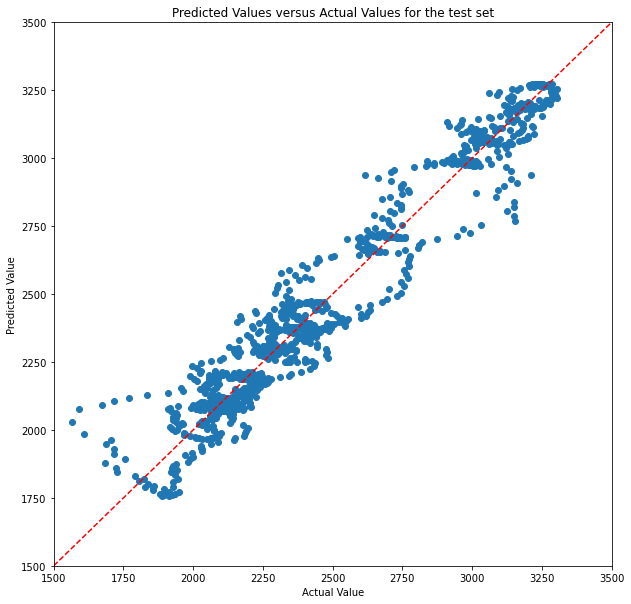

In [13]:
#(4) Your code goes here
fig = plt.figure(figsize=(10,10))

plt.title('Predicted Values versus Actual Values for the test set')
plt.scatter(y_test, y_pred_test)
plt.plot([1500,3500],[1500, 3500], 'r--')
plt.xlabel('Actual Value')
plt.ylabel('Predicted Value')
plt.xlim(xmin=1500,xmax=3500)
plt.ylim(ymin=1500,ymax=3500)

plt.show()

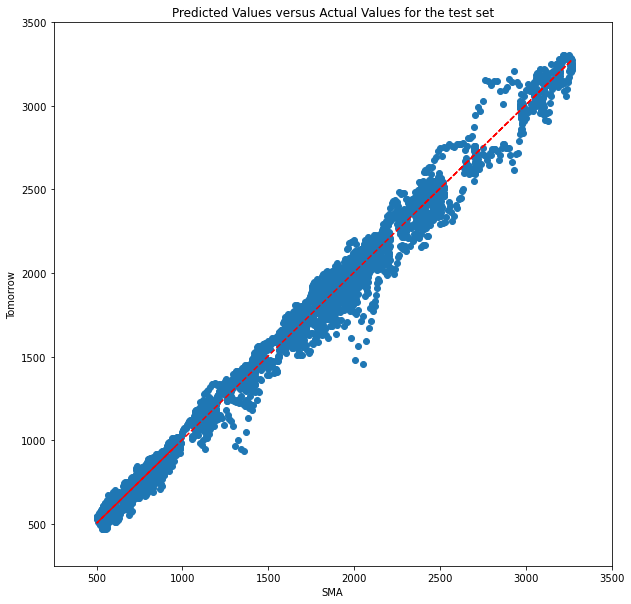

In [14]:
#(5) Your code goes here
x_data = df_copy3['SMA'].values

def lm_func(x):
    return lm.coef_[0][0]*x + lm.intercept_[0]
     
regression_result = list(map(lm_func, x_data))

fig = plt.figure(figsize=(10,10))

plt.title('Predicted Values versus Actual Values for the test set')
plt.scatter(df_copy3['SMA'].values, df_copy3['Tomorrow'].values)
plt.plot(x_data, regression_result, 'r--')
plt.xlabel('SMA')
plt.ylabel('Tomorrow')
plt.xlim(xmin=250,xmax=3500)
plt.ylim(ymin=250,ymax=3500)

plt.show()

#(6) Your text goes here

$R^2$ represents the accuracy of our prediction, the maximum is 1. The result of our model is very close to 1, which stands for a quite good prediction result.  
RMSE stands for the average error from our predicted result to real value. Here the average distance from our prediction to the real training distance is 57.840, but the average distance for test set is 101.808. The distance in test set is larger than that in training set, which means our model is a little bit overfitting to training set.

\pagebreak

# ========== 1.4 ==========

1. [Code] Instead of using libraries for linear regression, write the code of your own for finding the regression coefficients of the regression model that predicts 'Tomorrow' from 'SMA'. Run your code and show the coefficients, where you should use the same training data as Question 1.3.
2. [Text] One of the common metric used for evaluating the performance of regression models is Mean Squared Error (MSE). Write out the expression for MSE and list one of its limitations and how it can be addressed with alternative metrics.

\pagebreak
## Codes for 1.4

In [15]:
#(1) Your code goes here
x_data = X_train
y_data = y_train

sum_xi_yi = 0
sum_xi_xi = 0

for i in range(0, len(x_data)):
    sum_xi_yi += (x_data[i] - np.mean(x_data)) * (y_data[i] - np.mean(y_data))
    sum_xi_xi += (x_data[i] - np.mean(x_data)) **2
    
a = sum_xi_yi/sum_xi_xi
b = np.mean(y_data) - a*np.mean(x_data)

print('The coefficients: {}'.format(a[0]))

The coefficients: 1.0005937570665873


#(2) Your text goes here


MSE = $\frac{1}{n}\displaystyle \sum^{m}_{i=1}{(y_i - \hat{y}_i)^2}$    
**limitation**:MSE is sensitive to outliers. A small number of outliers will produce large error to predictive model.  
**alternative metrics**: ${R^2}$

\pagebreak

# ========== 1.5 ==========
#### Multiple linear regression and polynomial regression

We here consider multiple linear regression that employs four variables ('RSI', 'SMA', 'BBP', 'ADX') to predict 'Tomorrow'. We use the same training data and test data as Question 1.3.
1. [Code] Train the multiple linear regression model on the training set and show the model parameters and the coefficient of determination $R^2$. You also show the RMSE for the training set and test set respectively.
2. [Code] We now extend the model to the polynomial regression model, in which we use all polynomial combinations of the variables up to the specified degree $p$. Using $p=2$, run an experiment in the same manner as 1 above and report the model parameters and $R^2$. You also report the RMSE for the training and test sets respectively. You should use the sklearn implementation of Linear Regression and Polynomial Features. 
3. [Text] Comparing the results you obtained here and those in Question 1.3, report your findings and give discussions briefly.

\pagebreak
## Codes for 1.5

In [16]:
#(1) Your code goes here
df_copy5 = df.copy(deep=True)

X5 = df_copy5.drop(['Open', 'High', 'Low', 'Close', 'Volume','Tomorrow', 'Target'], axis=1).values
y5 = df_copy5['Tomorrow'].values
y5 = y5[:,np.newaxis]

train_size = int(len(df_copy5) * 0.8)
X5_train, X5_test = X5[:train_size,:], X5[train_size:,:]
y5_train, y5_test = y5[:train_size], y5[train_size:]

lm5 = LinearRegression(fit_intercept=True, copy_X=True).fit(X5_train, y5_train)

print('Model parameters:', lm5.coef_)
print('intercept_:', lm5.intercept_)
print('R^2(score): {:.3f}'.format(lm5.score(X5_train, y5_train)))
y5_pred = lm5.predict(X5_test)
r2_5 = r2_score(y5_test, y5_pred)
y5_pred_train = lm5.predict(X5_train)
r2_train5 = r2_score(y5_train, y5_pred_train)
print('R^2 for test set: {:.3f}'.format(r2_5))
print('R^2 for training set: {:.3f}'.format(r2_train5))
# for training set
y5_pred_train = lm5.predict(X5_train)
rmse5_train = np.sqrt(mean_squared_error(y5_train, y5_pred_train))
print('RMSE for training set: {:.3f}'.format(rmse5_train))

# for test set
y5_pred_test = lm5.predict(X5_test)
rmse5_test = np.sqrt(mean_squared_error(y5_test, y5_pred_test))
print('RMSE for test set: {:.3f}'.format(rmse5_test))

Model parameters: [[ 4.12238632  0.99861004 -3.85184563 -0.79817086]]
intercept_: [-189.82907589]
R^2(score): 0.997
R^2 for test set: 0.979
R^2 for training set: 0.997
RMSE for training set: 29.344
RMSE for test set: 59.725


In [17]:
#(2) Your code goes here
poly = PolynomialFeatures(degree = 2)
X_poly = poly.fit_transform(X5)

train_size = int(len(df_copy5) * 0.8)
X5_poly_train, X5_poly_test = X_poly[:train_size,:], X_poly[train_size:,:]
y5_poly_train, y5_poly_test = y5[:train_size], y5[train_size:] 

lr2 = LinearRegression(fit_intercept=True, copy_X=True).fit(X5_poly_train, y5_poly_train)

#X5_poly_train, X5_poly_test, y5_poly_train, y5_poly_test = train_test_split(X_poly, 
#                                                                            y5, 
#                                                                            train_size=0.8, 
#                                                                            test_size=0.2, 
#                                                                            random_state=0)
# w & r^2
print('w:', lr2.coef_)
print('intercept_:', lr2.intercept_)
print('R^2(score): {:.3f}'.format(lr2.score(X5_poly_train, y5_poly_train)))
y_poly_pred = lr2.predict(X5_poly_test)
r2_poly = r2_score(y5_poly_test, y_poly_pred)
print('R^2 for test set: {:.3f}'.format(r2_poly))
y_ploy_train = lr2.predict(X5_poly_train)
r2_poly_train = r2_score(y5_poly_train, y_ploy_train)
print('R^2 for training set: {:.3f}'.format(r2_poly_train))
# for training set
y5_poly_pred_train = lr2.predict(X5_poly_train)
rmse5_poly_train = np.sqrt(mean_squared_error(y5_poly_train, y5_poly_pred_train))
print('RMSE for training set: {:.3f}'.format(rmse5_poly_train))

# for test set
y5_poly_pred_test = lr2.predict(X5_poly_test)
rmse5_poly_test = np.sqrt(mean_squared_error(y5_poly_test, y5_poly_pred_test))
print('RMSE for test set: {:.3f}'.format(rmse5_poly_test))

w: [[ 0.00000000e+00  2.84683278e+00  9.53992375e-01  7.64940632e+01
  -1.73723982e+00 -1.21707733e-02  1.14658538e-03 -1.50541176e+00
   5.21044922e-02 -1.44494196e-06 -9.90124764e-03 -2.40108533e-04
   3.83619196e+01 -7.64155256e-01 -1.45302055e-02]]
intercept_: [-125.13477757]
R^2(score): 0.998
R^2 for test set: 0.984
R^2 for training set: 0.998
RMSE for training set: 27.987
RMSE for test set: 51.951


#(3) Your text goes here

Comparing results, we can find   
1) that RMSE results from polynomial regression model for test and training set are both much smaller than that of linear regression model.  
2) ${R^2}$ socres of polynomial regression model are all more close to 1 than socres of linear regression model.  
That means polynomial regression model fits data feature better, polynomial regression model is a better choice and can have better predictive result for unseen data.

\pagebreak

# ========== 1.6 ==========
#### Classification

We now consider the prediction of stock price movement as a binary classification problem - class 1 for upward movement and class 0 otherwise. We use the four technical Indicators, 'RSI', 'SMA', 'BBP', 'ADX', as input features to a classifier to predict 'Target'.

1. [Code] Using 10-fold cross validation with ***no shuffling*** on ***the whole data***, train four classifiers, Logistic Regression, SVM, Decision Trees, and Random Forests. Display, in a single graph, the validation accuracy with boxplot for each model. For each model, you also report the mean accuracy and mean F-score for the training set and validation set, respectively.
(NB: You should obtain the accuracy and F-score for each trial of k-fold cross validation, which will be used for plotting a boxplot. A mean value/score denotes the average value over the $k$ trials, where $k=10$).
<br> ***Note***: you should use sklearn's KFold, SVC, DecisionTreeClassifier, RandomForestClassifier, and LogisticRegression. For each classification model, use default parameters except that "***random_state=0***" should be specified.
2. [Code] Further to the above, for each model, display the confusion matrix for the validation sets, where rows correspond to true class labels and columns to predicted ones, and each element of the matrix shows the number of corresponding instances.
3. [Text] Comment on which model is best with respect to false positives and false negatives. 


\pagebreak
## Codes for 1.6

         Result for Logistic Regression
   Train Mean Accuracy  Test Mean Accuracy  Train F-score  Test F-score
0             0.534962            0.518584       0.695943      0.682984
1             0.535749            0.532743       0.688104      0.695150
2             0.529736            0.572695       0.682869      0.726447
3             0.532887            0.539007       0.695272      0.700461
4             0.532296            0.544326       0.694691      0.704937
5             0.537022            0.501773       0.698783      0.668241
6             0.536629            0.505319       0.698449      0.671378
7             0.535447            0.519504       0.685676      0.677765
8             0.531902            0.553191       0.691419      0.712329
9             0.535053            0.519504       0.697114      0.683781
         Result for SVM
   Train Mean Accuracy  Test Mean Accuracy  Train F-score  Test F-score
0             0.535159            0.518584       0.697203      0.682984


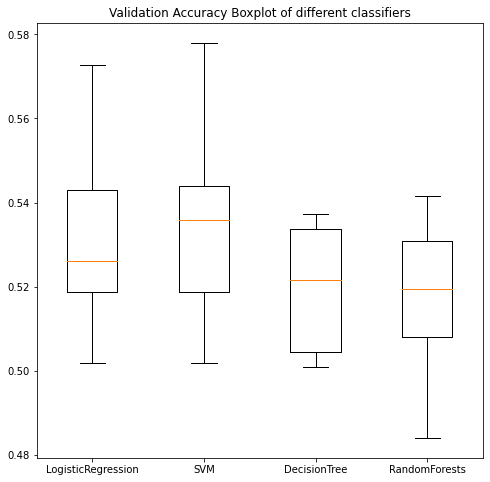

In [18]:
#(1) Your code goes here
df_copy6 = df.copy(deep=True)

X6 = df_copy6.drop(['Open', 'High', 'Low', 'Close', 'Volume','Tomorrow', 'Target'], axis=1).values
y6 = df_copy5['Target'].values

lr_result = pd.DataFrame(columns=['Train Mean Accuracy', 'Test Mean Accuracy', 
                                   'Train F-score', 'Test F-score'])
svm_result = pd.DataFrame(columns=['Train Mean Accuracy', 'Test Mean Accuracy', 
                                   'Train F-score', 'Test F-score'])
dt_result = pd.DataFrame(columns=['Train Mean Accuracy', 'Test Mean Accuracy', 
                                   'Train F-score', 'Test F-score'])
rf_result = pd.DataFrame(columns=['Train Mean Accuracy', 'Test Mean Accuracy', 
                                   'Train F-score', 'Test F-score'])
overall_result = pd.DataFrame(columns=['Train Accuracy', 'Test Accuracy', 
                                   'Train F-score', 'Test F-score'])
kf = KFold(n_splits = 10)

k = 0
for train_index, test_index in kf.split(X6):
    X6_train, X6_test = X6[train_index], X6[test_index]
    y6_train, y6_test = y6[train_index], y6[test_index]
    
    # logistic regression
    lr_ = LogisticRegression(random_state=0).fit(X6_train, y6_train)

    # SVM
    svm_ = SVC(random_state=0).fit(X6_train, y6_train)

    # decision tree
    dt_ = DecisionTreeClassifier(random_state=0).fit(X6_train, y6_train)

    # random forests
    rf_ = RandomForestClassifier(random_state=0).fit(X6_train, y6_train)

    y6_lr_train = lr_.predict(X6_train)
    y6_lr_test = lr_.predict(X6_test)
    lr_result.loc[k] = [lr_.score(X6_train, y6_train), lr_.score(X6_test, y6_test),
                        f1_score(y6_train, y6_lr_train), f1_score(y6_test, y6_lr_test)]
    
    y6_svm_train = svm_.predict(X6_train)
    y6_svm_test = svm_.predict(X6_test)
    svm_result.loc[k] = [svm_.score(X6_train, y6_train), svm_.score(X6_test, y6_test),
                        f1_score(y6_train, y6_svm_train), f1_score(y6_test, y6_svm_test)]
    
    y6_dt_train = dt_.predict(X6_train)
    y6_dt_test = dt_.predict(X6_test)
    dt_result.loc[k] = [dt_.score(X6_train, y6_train), dt_.score(X6_test, y6_test),
                        f1_score(y6_train, y6_dt_train), f1_score(y6_test, y6_dt_test)]
    
    y6_rf_train = rf_.predict(X6_train)
    y6_rf_test = rf_.predict(X6_test)
    rf_result.loc[k] = [rf_.score(X6_train, y6_train), rf_.score(X6_test, y6_test),
                        f1_score(y6_train, y6_rf_train), f1_score(y6_test, y6_rf_test)]
    k = k+1
    

overall_result.loc['LogisticRegression'] = [lr_result['Train Mean Accuracy'].mean(), 
                        lr_result['Test Mean Accuracy'].mean(),
                        lr_result['Train F-score'].mean(),
                        lr_result['Test F-score'].mean()]
overall_result.loc['SVM'] = [svm_result['Train Mean Accuracy'].mean(), 
                        svm_result['Test Mean Accuracy'].mean(),
                        svm_result['Train F-score'].mean(),
                        svm_result['Test F-score'].mean()]
overall_result.loc['DecisionTree'] = [dt_result['Train Mean Accuracy'].mean(), 
                        dt_result['Test Mean Accuracy'].mean(),
                        dt_result['Train F-score'].mean(),
                        dt_result['Test F-score'].mean()]
overall_result.loc['RandomForests'] = [rf_result['Train Mean Accuracy'].mean(), 
                        rf_result['Test Mean Accuracy'].mean(),
                        rf_result['Train F-score'].mean(),
                        rf_result['Test F-score'].mean()]

print('         Result for Logistic Regression')
print(lr_result)
print('         Result for SVM')
print(svm_result)
print('         Result for Decision Tree')
print(dt_result)
print('         Result for Random Forests')
print(rf_result)
print('         Average Results for Different Classifiers')
print(overall_result)

plt.figure(figsize=(8,8))
plt.title('Validation Accuracy Boxplot of different classifiers')
labels = 'LogisticRegression','SVM','DecisionTree','RandomForests'
box1_, box2_, box3_, box4_ = lr_result['Test Mean Accuracy'],svm_result['Test Mean Accuracy'],dt_result['Test Mean Accuracy'], rf_result['Test Mean Accuracy']
plt.boxplot([box1_,box2_,box3_,box4_],labels=labels)
plt.show()

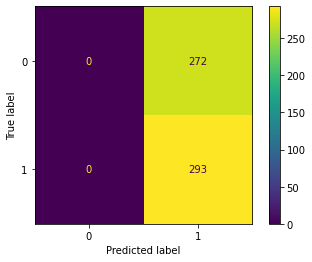

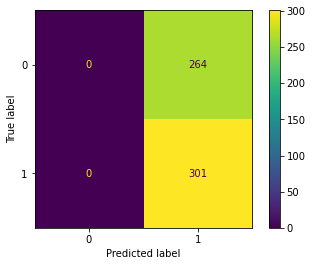

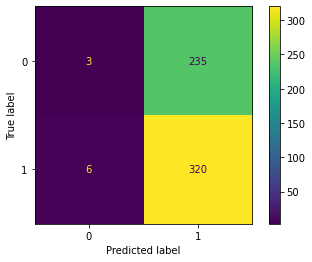

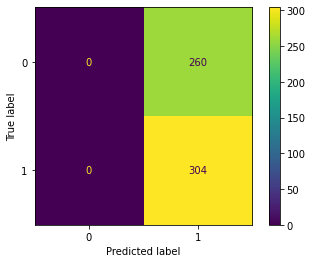

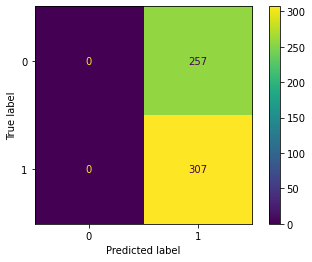

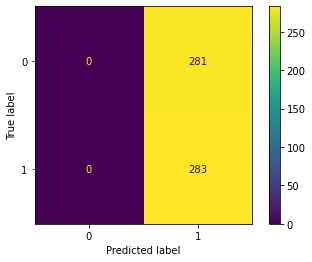

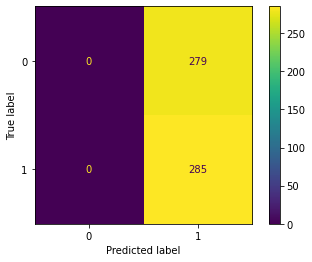

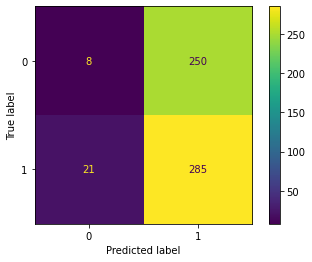

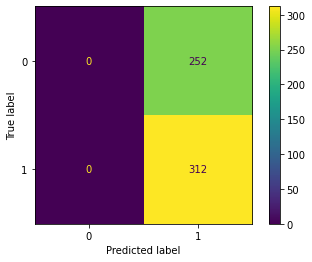

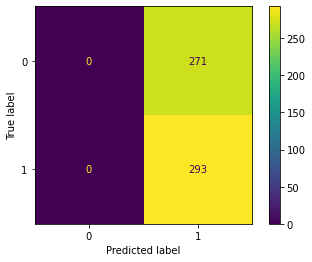

In [19]:
#(2) Your code goes here
# confusion matrix for Logistic Regression validation sets
count = 0
for train_index, test_index in kf.split(X6):
    X6_train, X6_test = X6[train_index], X6[test_index]
    y6_train, y6_test = y6[train_index], y6[test_index]
    lr_ = LogisticRegression(random_state=0).fit(X6_train, y6_train)
    y6_pred = lr_.predict(X6_test)
    ConfusionMatrixDisplay.from_predictions(y6_test, y6_pred)
    count = count + 1
    plt.show()

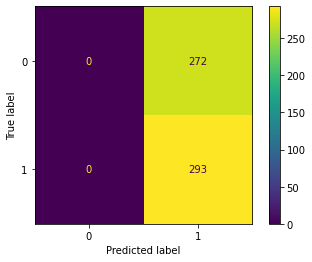

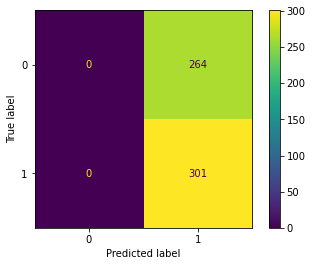

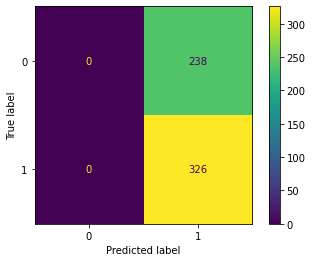

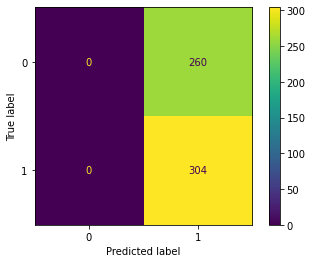

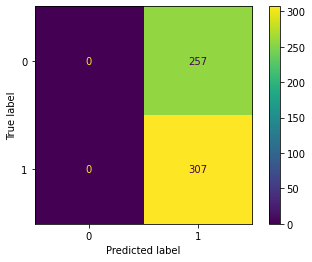

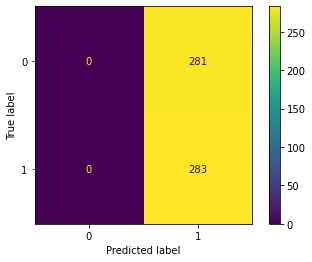

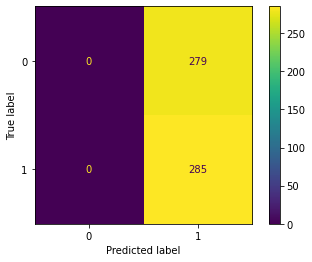

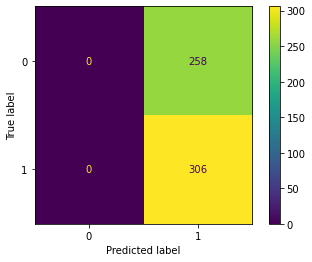

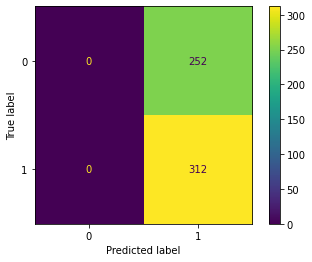

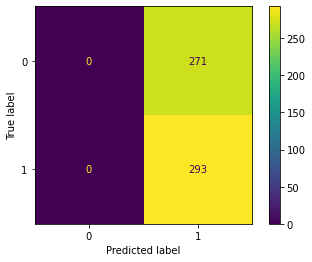

In [20]:
# confusion matrix for SVM validation sets
for train_index, test_index in kf.split(X6):
    X6_train, X6_test = X6[train_index], X6[test_index]
    y6_train, y6_test = y6[train_index], y6[test_index]
    svm_ = SVC(random_state=0).fit(X6_train, y6_train)
    y6_pred = svm_.predict(X6_test)
    ConfusionMatrixDisplay.from_predictions(y6_test, y6_pred)
    plt.show()

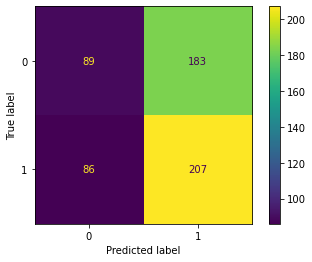

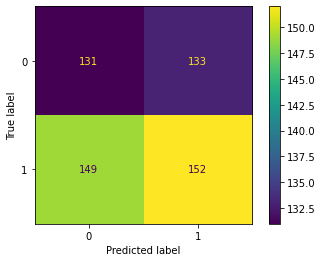

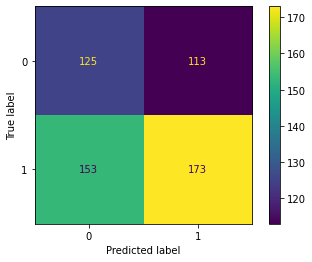

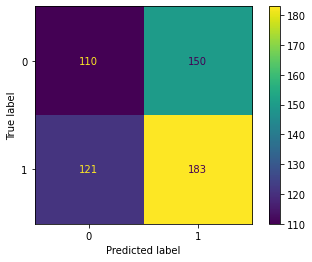

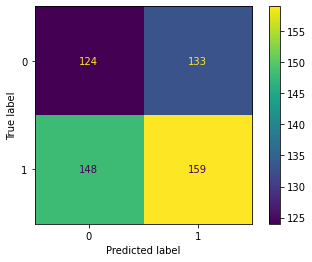

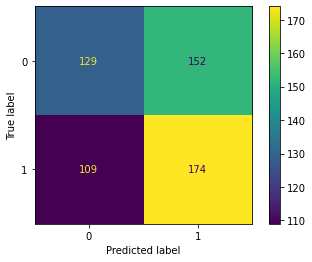

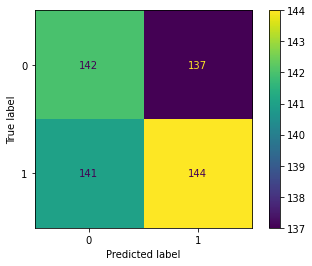

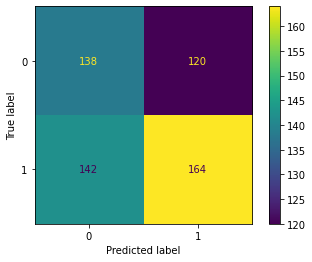

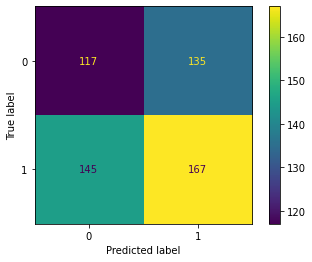

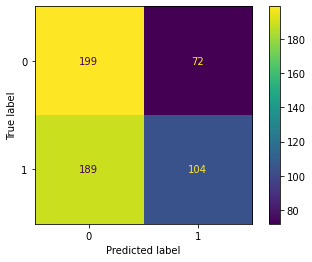

In [21]:
# confusion matrix for Decision Tree validation sets
for train_index, test_index in kf.split(X6):
    X6_train, X6_test = X6[train_index], X6[test_index]
    y6_train, y6_test = y6[train_index], y6[test_index]
    dt_ = DecisionTreeClassifier(random_state=0).fit(X6_train, y6_train)
    y6_pred = dt_.predict(X6_test)
    ConfusionMatrixDisplay.from_predictions(y6_test, y6_pred)
    plt.show()

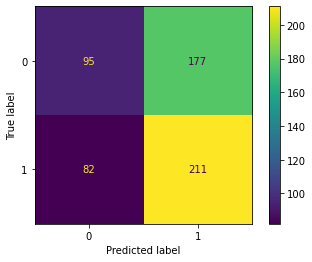

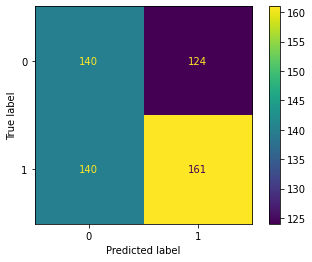

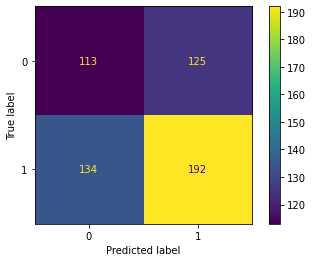

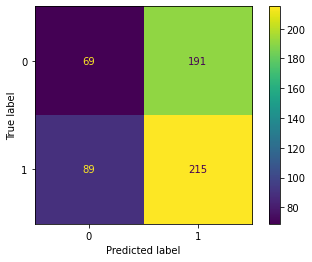

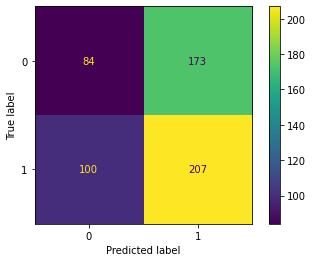

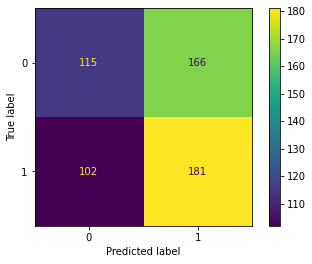

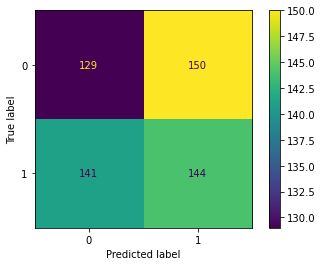

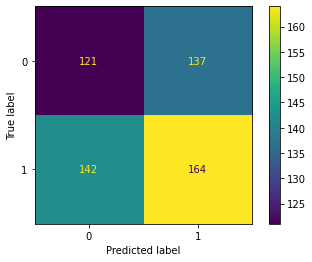

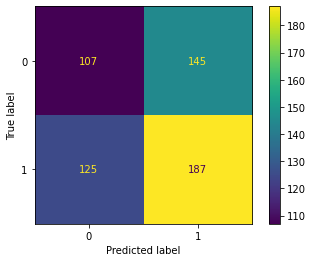

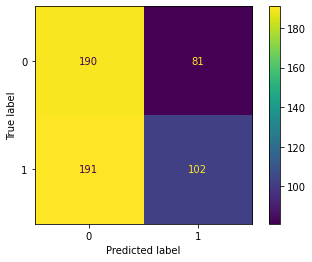

In [22]:
# confusion matrix for Random Forest validation sets
for train_index, test_index in kf.split(X6):
    X6_train, X6_test = X6[train_index], X6[test_index]
    y6_train, y6_test = y6[train_index], y6[test_index]
    rf_ = RandomForestClassifier(random_state=0).fit(X6_train, y6_train)
    y6_pred = rf_.predict(X6_test)
    ConfusionMatrixDisplay.from_predictions(y6_test, y6_pred)
    plt.show()

#(3) Your text goes here

Comparing confusion matrices above, we can find that the proporation of false positive instances and false negative instances are lower in random forests overall, So random forests should be the optimal choice.

\pagebreak

# ========== 1.7 ==========
#### Dimensionality Reduction 
Here we will perform dimensionality reduction with PCA to the data and run classification experiments on the dimensionality reduced data.

1. [Code] Using the four technical features ('RSI', 'SMA', 'BBP', 'ADX') as input data, apply PCA to ***the whole data*** and find the minimum set of principal components that explains at least 95% of the variance of the data. Report the number of principal components in the set you found.
2. [Code] Using the set of principal components you found above, reduce the dimensionality of the data and run classification experiments for the four classifiers in the same manner as we did in Question 1.6, but we now use the dimensionality-reduced data instead. You should plot boxplots and report accuracy and F-score in the same manner as Question 1.6. (Note that this experiment is not a formal one, as we apply PCA to the whole data, whose subset is used for testing.)
3. [Text] Comparing the results with those you obtained in Question 1.6, report your findings and give brief discussions.


\pagebreak
## Codes for 1.7

In [23]:
#(1) Your code goes here
df_copy7 = df.copy(deep=True)

X7 = df_copy7.drop(['Open', 'High', 'Low', 'Close', 'Volume','Tomorrow', 'Target'], axis=1)

pca = PCA(n_components=0.95)
pca.fit(X7)
pca.n_components_

1

            Result for Logistic Regression
   Train Mean Accuracy  Test Mean Accuracy  Train F-score  Test F-score
0             0.535946            0.518584       0.696704      0.682984
1             0.533583            0.532743       0.695864      0.695150
2             0.528555            0.578014       0.691574      0.732584
3             0.532887            0.539007       0.695272      0.700461
4             0.532296            0.544326       0.694769      0.704937
5             0.537022            0.501773       0.698783      0.668241
6             0.536629            0.505319       0.698449      0.671378
7             0.532493            0.542553       0.694937      0.703448
8             0.531312            0.553191       0.693930      0.712329
9             0.535053            0.519504       0.697114      0.683781
            Result for SVM
   Train Mean Accuracy  Test Mean Accuracy  Train F-score  Test F-score
0             0.535159            0.518584       0.697203      0.6

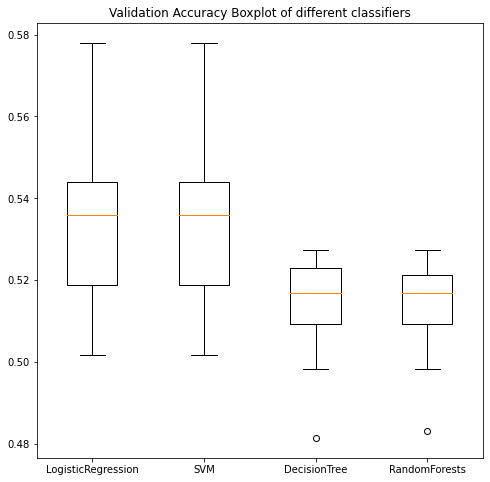

In [24]:
#(2) Your code goes here

X7 = pca.transform(X7)
y7 = df_copy7['Target'].values

lr_result7 = pd.DataFrame(columns=['Train Mean Accuracy', 'Test Mean Accuracy', 
                                   'Train F-score', 'Test F-score'])
svm_result7 = pd.DataFrame(columns=['Train Mean Accuracy', 'Test Mean Accuracy', 
                                   'Train F-score', 'Test F-score'])
dt_result7 = pd.DataFrame(columns=['Train Mean Accuracy', 'Test Mean Accuracy', 
                                   'Train F-score', 'Test F-score'])
rf_result7 = pd.DataFrame(columns=['Train Mean Accuracy', 'Test Mean Accuracy', 
                                   'Train F-score', 'Test F-score'])
overall_result7 = pd.DataFrame(columns=['Train Accuracy', 'Test Accuracy', 
                                   'Train F-score', 'Test F-score'])

kf = KFold(n_splits = 10)
k = 0
for train_index, test_index in kf.split(X7):
    X7_train, X7_test = X7[train_index], X7[test_index]
    y7_train, y7_test = y7[train_index], y7[test_index]
    
    # logistic regression
    lr_ = LogisticRegression(random_state=0).fit(X7_train, y7_train)
    y7_lr_train = lr_.predict(X7_train)
    y7_lr_test = lr_.predict(X7_test)
    lr_result7.loc[k] = [lr_.score(X7_train, y7_train), lr_.score(X7_test, y7_test),
                        f1_score(y7_train, y7_lr_train), f1_score(y7_test, y7_lr_test)]
    # SVM
    svm_ = SVC(random_state=0).fit(X7_train, y7_train)
    y7_svm_train = svm_.predict(X7_train)
    y7_svm_test = svm_.predict(X7_test)
    svm_result7.loc[k] = [svm_.score(X7_train, y7_train), svm_.score(X7_test, y7_test),
                        f1_score(y7_train, y7_svm_train), f1_score(y7_test, y7_svm_test)]

    # decision tree
    dt_ = DecisionTreeClassifier(random_state=0).fit(X7_train, y7_train)
    y7_dt_train = dt_.predict(X7_train)
    y7_dt_test = dt_.predict(X7_test)
    dt_result7.loc[k] = [dt_.score(X7_train, y7_train), dt_.score(X7_test, y7_test),
                        f1_score(y7_train, y7_dt_train), f1_score(y7_test, y7_dt_test)]
   

    # random forests
    rf_ = RandomForestClassifier(random_state=0).fit(X7_train, y7_train)
    y7_rf_train = rf_.predict(X7_train)
    y7_rf_test = rf_.predict(X7_test)
    rf_result7.loc[k] = [rf_.score(X7_train, y7_train), rf_.score(X7_test, y7_test),
                        f1_score(y7_train, y7_rf_train), f1_score(y7_test, y7_rf_test)]
    k = k+1
    

overall_result7.loc['LogisticRegression'] = [lr_result7['Train Mean Accuracy'].mean(), 
                        lr_result7['Test Mean Accuracy'].mean(),
                        lr_result7['Train F-score'].mean(),
                        lr_result7['Test F-score'].mean()]
overall_result7.loc['SVM'] = [svm_result7['Train Mean Accuracy'].mean(), 
                        svm_result7['Test Mean Accuracy'].mean(),
                        svm_result7['Train F-score'].mean(),
                        svm_result7['Test F-score'].mean()]
overall_result7.loc['DecisionTree'] = [dt_result7['Train Mean Accuracy'].mean(), 
                        dt_result7['Test Mean Accuracy'].mean(),
                        dt_result7['Train F-score'].mean(),
                        dt_result7['Test F-score'].mean()]
overall_result7.loc['RandomForests'] = [rf_result7['Train Mean Accuracy'].mean(), 
                        rf_result7['Test Mean Accuracy'].mean(),
                        rf_result7['Train F-score'].mean(),
                        rf_result7['Test F-score'].mean()]
print('            Result for Logistic Regression')
print(lr_result7)
print('            Result for SVM')
print(svm_result7)
print('            Result for Decision Tree')
print(dt_result7)
print('            Result for Random Forests')
print(rf_result7)
print('            Average Results for Different Classifiers')
print(overall_result7)

plt.figure(figsize=(8,8))
plt.title('Validation Accuracy Boxplot of different classifiers')
labels = 'LogisticRegression','SVM','DecisionTree','RandomForests'
box1_, box2_, box3_, box4_ = lr_result7['Test Mean Accuracy'],svm_result7['Test Mean Accuracy'],dt_result7['Test Mean Accuracy'], rf_result7['Test Mean Accuracy']
plt.boxplot([box1_,box2_,box3_,box4_],labels=labels)
plt.show()

#(3) Your text goes here

The boxplot in 1.7 is generally similar to boxplot in 1.6, but there are some difference. Decision Tree and Random Forests perform better in predicting after dimensionality reduction. The body of boxes in these two classifiers are shorter, but there appears outliers.  
There's almost no difference on SVM model before and after dimensionality reduction.  
There's little difference in Logistic Regression.

\pagebreak

# ========== 1.8 ==========


We considered only four technical features so far to find that movement classification with the four classifiers is challenging.
We would like to know whether we could improve the performance if we use more features, apply preprocessing to the data, and tune up model parameters.
To find some answer to the question, carry out a mini project with the following conditions:
* We use another data set file ("dset_q1b.csv") for this project, which is an extended version of the original one and contains 15 technical indicators. Load the dataset in the following manner:
>   df1b = pd.read_csv("dset_q1b.csv", index_col="Date", parse_dates=True)
* We consider SVM (SVC) only.
* We split the data into two subsets without shuffling - the first 80% of data should be used for training and validation, and the remaining 20% for testing. 
* We will limit the duration of the project to a few hours only.
* The outcome of the project is not necessarily positive. It is not surprising that you cannot find much improvement.

1. [Text] Describe your ideas for improving the classification performance. Your ideas should be concrete and feasible - the project should be done in the specified time length.
2. [Code and text] Implement your ideas, run experiments, and report the results including accuracy and F-score for the training set and test set respectively.
3. [Code and text] Examine whether your improvement or deterioration is statistically significant.
4. [Text] Summarise your findings and show your answer to the question. In case of negative results, explain the reasons for the negative outcomes.

\pagebreak
## Codes for 1.8

#(1) Your text goes here

First, draw pairplot to try to find some patterns in the 15 technical indicators.  
Then, pick up 3 groups of indicators with different number of indicators involved.(num of indicators = 6,9,12) 
Next, build 3 SVM models seperately with different indicator sets.
Use data set to train and test model.  
Compare their performance on training and test data and conclude.  

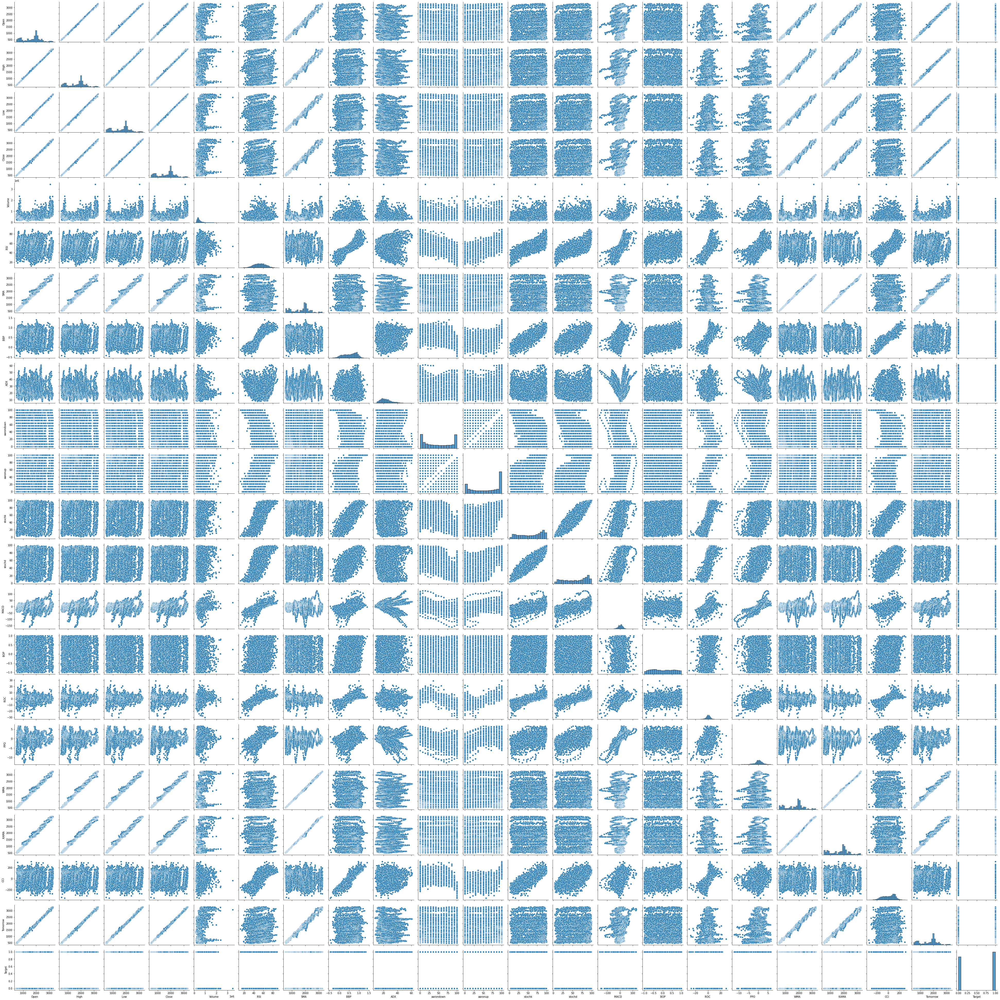

In [25]:
#(2) Your code and text goes here
df1b = pd.read_csv("dset_q1b.csv", index_col="Date", parse_dates=True)

sns.pairplot(data=df1b)

observing pairplot, we need to reduce the indicators with too much linear relations in our selection.  
so, we are going to pick:  
1) 6 indicators: **RSI, SMA, BBP, ADX, aarondown, MACD**.  
2) 9 indicators: **RSI, SMA, BBP, ADX, aarondown, CCI,KAMA,stochk, BOP**.  
3) 12 indicators; **RSI, SMA, BBP, ADX, aarondown, CCI,KAMA,stochk, BOP, stochd, ROC, PPO**.

In [26]:
compare_table = pd.DataFrame(columns=['Train_Mean_Accuracy', 'Test_Mean_Accuracy', 
                                   'Train_F-score', 'Test_F-score'])

y_8 = df1b['Target'].values
train_size = int(len(df1b) * 0.8)
# plan A
dfb_copy = df1b.copy(deep=True)
XA = dfb_copy.drop(['Open', 'High', 'Low', 'Close', 'Volume','aaronup','stochk','stochd','BOP',
               'ROC','PPO','WMA','KAMA','CCI','Tomorrow', 'Target'], axis=1).values

XA_train, XA_test = XA[:train_size,:], XA[train_size:,:]
ya_train, ya_test = y_8[:train_size], y_8[train_size:]

# SVM
svm_a = SVC(random_state=0).fit(XA_train, ya_train)
ya_train_pred = svm_a.predict(XA_train)
ya_test_pred = svm_a.predict(XA_test)
compare_table.loc['6indicators'] = [svm_a.score(XA_train, ya_train), svm_a.score(XA_test, ya_test),
                        f1_score(ya_train, ya_train_pred), f1_score(ya_test, ya_test_pred)]

# plan B
dfb_copy2 = df1b.copy(deep=True)
XB = dfb_copy2.drop(['Open', 'High', 'Low', 'Close', 'Volume','aaronup','MACD',
               'stochd','ROC','PPO','WMA','Tomorrow', 'Target'], axis=1).values


XB_train, XB_test = XB[:train_size,:], XB[train_size:,:]
yb_train, yb_test = y_8[:train_size], y_8[train_size:]

# SVM
svm_b = SVC(random_state=0).fit(XB_train, yb_train)
yb_train_pred = svm_b.predict(XB_train)
yb_test_pred = svm_b.predict(XB_test)
compare_table.loc['9indicators'] = [svm_b.score(XB_train, yb_train), svm_b.score(XB_test, yb_test),
                        f1_score(yb_train, yb_train_pred), f1_score(yb_test, yb_test_pred)]

# plan c
dfb_copy4 = df1b.copy(deep=True)
XC = dfb_copy4.drop(['Open', 'High', 'Low', 'Close', 'Volume','aaronup','MACD',
               'WMA','Tomorrow', 'Target'], axis=1).values


XC_train, XC_test = XC[:train_size,:], XC[train_size:,:]
yc_train, yc_test = y_8[:train_size], y_8[train_size:]

# SVM
svm_c = SVC(random_state=0).fit(XC_train, yc_train)
yc_train_pred = svm_c.predict(XC_train)
yc_test_pred = svm_c.predict(XC_test)
compare_table.loc['12indicators'] = [svm_c.score(XC_train, yc_train), svm_c.score(XC_test, yc_test),
                        f1_score(yc_train, yc_train_pred), f1_score(yc_test, yc_test_pred)]

compare_table

,Train_Mean_Accuracy,Test_Mean_Accuracy,Train_F-score,Test_F-score
6indicators,0.533038,0.536348,0.695401,0.698211
9indicators,0.533038,0.536348,0.695401,0.698211
12indicators,0.533038,0.536348,0.695401,0.698211


In [27]:
#(3) Your code and text goes here
compare_table.loc['4 indicators(1.6)'] = [0.533499,0.533502,0.695790,0.695529]
compare_table

,Train_Mean_Accuracy,Test_Mean_Accuracy,Train_F-score,Test_F-score
6indicators,0.533038,0.536348,0.695401,0.698211
9indicators,0.533038,0.536348,0.695401,0.698211
12indicators,0.533038,0.536348,0.695401,0.698211
4 indicators(1.6),0.533499,0.533502,0.695790,0.695529


Comparing results with new indicators with previous performance in 1.6, we find that the mean accuracy and F-score on training set decrease, but accuracy and F-score on test set increase.  
This means the model with higher dimensions has better performance but the improvement is limited.

#(4) Your text goes here

As more features involved in, the performance of SVM can be improved. But when dimensions become large, the improvement is limited, so we need to think about the balance between time&resource cost and improvement of accuracy.

\pagebreak